# Part 2. Deep Image Prior (DIP) — 10 points


### Theory

Deep Image Prior [1] can be viewed as an implicit conditional generative model:

\begin{equation}
p(x \mid x_0) = \int p(x \mid \theta, \mathcal{z}, x_0)\, p(\theta \mid x_0)\, p(\mathcal{z})\,d\theta\,d\mathcal{z}\,,
\end{equation}

Latent parameters of this model consist of the weights of the neural network $\theta$ and a fixed input $\mathcal{z}$, which is fed into the network. 

If we denote the network by $f$, the output $x$ is produced in the following way:

$$
x = f_\theta(\mathcal{z}).
$$

This this model is implicit: we cannot evaluate the integral above. In the case of DIP, both likelihood and prior are unknown. But, as with all implicit models, we can perform sampling from $p(x \mid x_0)$.

Similarly to style transfer models, the sampling is done via optimization. The algorithm is following:

1. Sample a data point $x_0$ from a data distribution.
2. Initialize $\theta$ with $\theta_0$ and $\mathcal{z}$ with $z$.
3. Perform an optimization of some error function $E$ with respect to the weights of the neural network: 

$$
\min_\theta E(f_\theta(z), x_0).
$$

4. Hand-pick the weights $\theta_M$ at intermediate optimization step $M$ and denote them as $\theta^*$

Now, the most counter-intuitive thing about this model is the fact that it can be used for image restoration (inpainting, denoising) and super-resolution. In this case, $x_0$ is a degraded version of a target image $x$. And, by trying to predict this degraded image using a network (via minimization of an error between the predicted image $f_\theta(z)$ and $x_0$) at some optimization step $M$ we will obtain its restored or upscaled version.

The main trick is that instead of optimizing with respect to an input tensor $z$, like in style-transfer models, we keep the input fixed and optimize with repect to the weights of the network. Brief explanation of this result is provided below, for more details please refer to [1].

On one hand, a convolutional neural network is close to a universal functional approximator, and, given enough training iterations, it can fit a manifold of arbitrary complexity [2]. On the other hand, it is observed in practice that early stopping leads to solutions with good generalization (same networks, as in [2], can be properly trained to achieve good generalization). In DIP paper this phenomena is explored for image synthesis, and it was shown that the same intuition about generalization also applies here. Remarkably though, the generalization results were obtained for a highly complex manifold of natural images, which once again shows how well-suited are convolutional neural networks for image processing and synthesis.

### Task

The general goal of the task is for you to reproduce the results from the paper:

using a Mean Square Error (MSE) as an error function,

1. perform denoising of the images in the folder "data/denoising",
2. perform inpaiting of the images in the folder "data/inpaiting" (for inpainting, apply the loss only over the known area of the image using a provided mask),

with a UNet-style network (with 4 downsampling layers, and 16, 32, 64 and 128 filters at the end of each block).

For architecture reference, please read this blog post:
https://towardsdatascience.com/unet-line-by-line-explanation-9b191c76baf5.

If you have used a UNet-style network in the first part of the assignment on segmentation, you can reuse the code.

### Notes

- You have to play with the number of iterations $M$ used for early stopping, and use the optimal value to denoise and inpaint the images from the task. For each task you may need to find different optimal values. The source code and the results of your experiments should be provided in this notebook.
- Use Adam as your default optimizer, but feel free to experiment with the other optimizers or even architectures of the network. The most thorough experiments will be graded with bonus points. The final score for the homework is calculated as $\min ( \text{points} + \text{bonus_points}, \text{max_points} ) $.

### References

[1] Ulyanov et. al., "Deep Image Prior", CVPR 2018, https://arxiv.org/abs/1711.10925

[2] Zhang et. al., "Understanding deep learning requires rethinking generalization", ICLR 2017, https://arxiv.org/abs/1611.03530

In [1]:
### Download the dataset ###
!wget https://www.dropbox.com/s/si5o4dp4qa59cyy/data.zip?dl=0 -O data.zip
!unzip -q data.zip

--2020-05-13 22:50:26--  https://www.dropbox.com/s/si5o4dp4qa59cyy/data.zip?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.1.1, 2620:100:6016:1::a27d:101
Connecting to www.dropbox.com (www.dropbox.com)|162.125.1.1|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/si5o4dp4qa59cyy/data.zip [following]
--2020-05-13 22:50:26--  https://www.dropbox.com/s/raw/si5o4dp4qa59cyy/data.zip
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc8b42b8beda6e23a79ce0eb2942.dl.dropboxusercontent.com/cd/0/inline/A3ol6g3dqKAjWOfKyCPNsay_-DFjDeAstZh3UmvUKHnlUemTbEp1MTiSv_9dCKSs3l-rnmdbUPZCEI28F5GrY7fJgRnRckaQIvh7Rb_gA7pJSN8AgcCIQEmdeUKG35TC8PQ/file# [following]
--2020-05-13 22:50:26--  https://uc8b42b8beda6e23a79ce0eb2942.dl.dropboxusercontent.com/cd/0/inline/A3ol6g3dqKAjWOfKyCPNsay_-DFjDeAstZh3UmvUKHnlUemTbEp1MTiSv_9dCKSs3l-rnmdbUPZCEI28F5GrY7fJgRnRckaQIvh7Rb_gA7pJSN8AgcCIQEmde

In [0]:
import torch
from torch import nn
import torchvision
from torchvision import transforms
import os
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils
from torch.utils.tensorboard import SummaryWriter
import random
from PIL import Image

import matplotlib.pyplot as plt
import numpy as np
import skimage
from skimage import io
%matplotlib inline

In [0]:
class UnetDownBlock(nn.Module):
    def __init__(self, in_channels, out_channels, pooling=True):
        super().__init__()
        
        # your code here
        self.convs = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(),
        )
        self.maxpool = nn.MaxPool2d(kernel_size=2)
        
    def forward(self, x):
        # x: a tensor of shape (batch_size, in_channels, layer_height, layer_width)
        
        # your code here
        out_before_pooling = self.convs(x)
        out = self.maxpool(out_before_pooling)

        return out, out_before_pooling

class UnetUpBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        
        # your code here
        self.upsample = nn.Upsample(scale_factor=2)
        self.convs = nn.Sequential(
            nn.Conv2d(in_channels * 2, out_channels, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(),
        )
        
    def forward(self, x, x_bridge):
        # x: a tensor of shape (batch_size, in_channels, layer_height // 2, layer_width // 2)
        # x_bridge: a tensor of shape (batch_size, in_channels, layer_height, layer_width)
        
        # your code here
        x_up = self.upsample(x)
        x_concat = torch.cat([x_up, x_bridge], dim=1)
        out = self.convs(x_concat)
        
        return out
    
    
class Unet(nn.Module):
    def __init__(self, n_base_channels=64):
        super().__init__()
        
        # your code here
        self.down_blocks = nn.ModuleList([
            UnetDownBlock(3, n_base_channels),
            UnetDownBlock(n_base_channels, n_base_channels * 2),
            UnetDownBlock(n_base_channels * 2, n_base_channels * 4),
            UnetDownBlock(n_base_channels * 4, n_base_channels * 8),
            UnetDownBlock(n_base_channels * 8, n_base_channels * 8)
        ])
        self.up_blocks = nn.ModuleList([
            UnetUpBlock(n_base_channels * 8, n_base_channels * 4),
            UnetUpBlock(n_base_channels * 4, n_base_channels * 2),
            UnetUpBlock(n_base_channels * 2, n_base_channels),
            UnetUpBlock(n_base_channels, n_base_channels),
        ])
        self.final_block = nn.Sequential(
            #  nn.Conv2d(n_base_channels, 3, kernel_size=1, padding=0),
            nn.Conv2d(n_base_channels, 3, kernel_size=3, padding=1)
        )
            
        
    def forward(self, x):
        
        # your code here
        out = x
        outputs_before_pooling = []
        for i, block in enumerate(self.down_blocks):
            out, before_pooling = block(out)
            outputs_before_pooling.append(before_pooling)
            # easy mistake can be made here: for last layer, we need to save out_before_pooling
        out = before_pooling

        # now outputs_before_pooling = [block1_before_pooling, ..., block5_before_pooling]
        
        for i, block in enumerate(self.up_blocks):    # NB: it's easier to understand when using counter (i=3, etc.)
            out = block(out, outputs_before_pooling[-i - 2])
        out = self.final_block(out)
        
        return out

### Image denoising

In [0]:
def normalize(image):
    return (image/255 - 0.5)*2
def to_image(normalized_image):
    return ((normalized_image/2 + 0.5) * 255).astype(np.uint8)

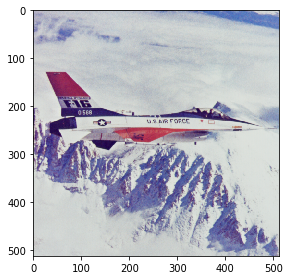

In [0]:
img_plane = skimage.img_as_ubyte(io.imread('./data/denoising/F16_GT.png'))
img_plane = np.array(img_plane)
io.imshow(img_plane)

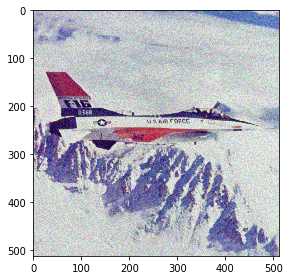

In [0]:
# adding noise to image
noise = np.random.randint(-30, 30, size = img_plane.shape)

noisy_plane = (img_plane + noise).clip(0,255).astype(np.uint8)

io.imshow(noisy_plane)

In [0]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

noisy_plane_torch = torch.Tensor(normalize(np.rollaxis(noisy_plane,2,0)[None])).to(device)


x_input = torch.Tensor(np.random.random(size = noisy_plane_torch.shape)).to(device)

In [0]:
#loss
mse = torch.nn.MSELoss().to(device)

unet = Unet(n_base_channels=16).to(device)

optimizer = torch.optim.Adam(unet.parameters(),lr=0.0001)

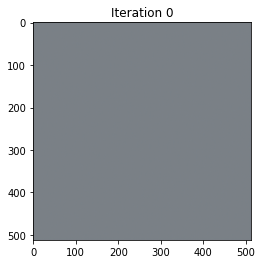

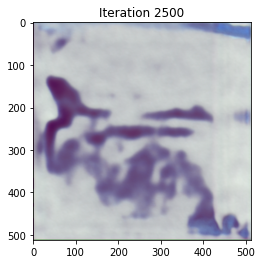

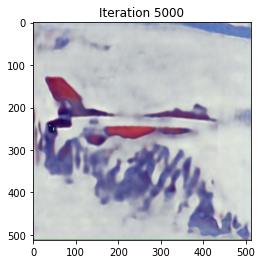

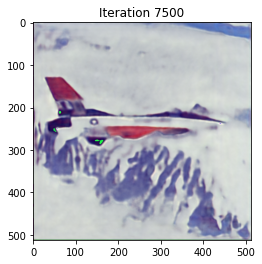

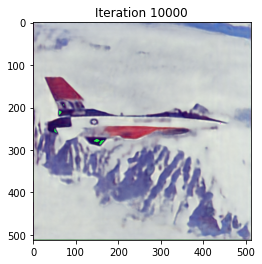

...

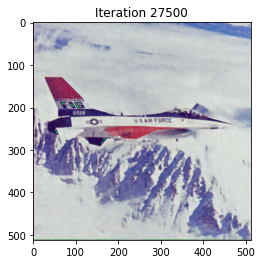

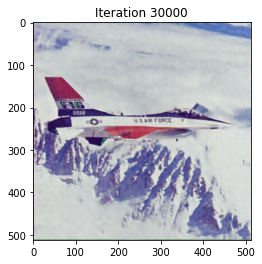

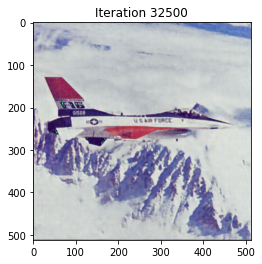

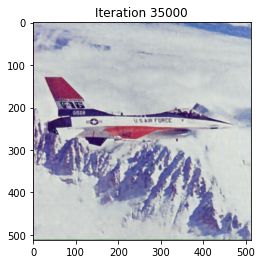

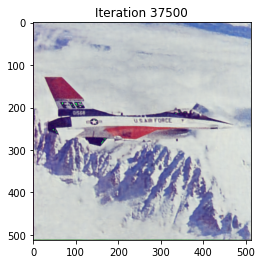

In [0]:
num_iterations = 40000

for i in range(num_iterations):
    
    output = unet(x_input)
    
    optimizer.zero_grad()
    loss = mse(output, noisy_plane_torch)
    loss.backward()
    optimizer.step()
    if i%2500==0:
        plt.title('Iteration '+ str(i))
        plt.imshow(to_image(np.rollaxis(output.detach().cpu().numpy()[0], 0, 3)))
        plt.pause(0.05)

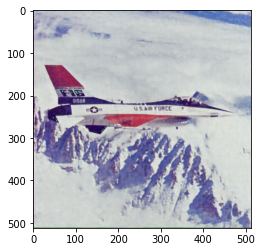

In [0]:
# additional iterations
for i in range(5000):
    
    output = unet(x_input)
    
    optimizer.zero_grad()
    loss = mse(output, noisy_plane_torch)
    loss.backward()
    optimizer.step()

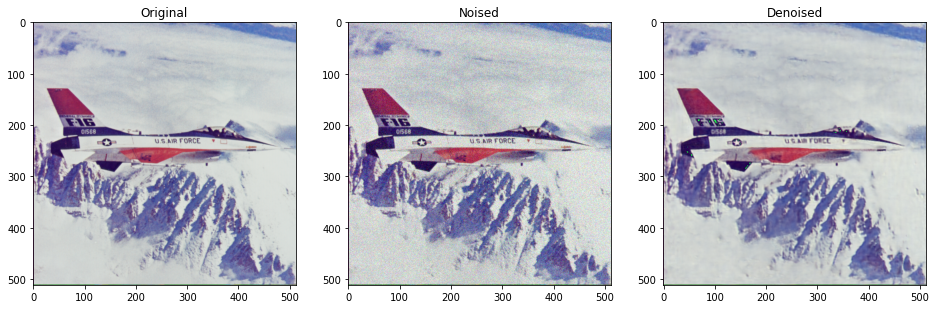

In [0]:
f, axarr = plt.subplots(1,3, figsize=(16,8))
axarr[0].imshow(img_plane)
axarr[1].imshow(noisy_plane)
axarr[2].imshow(to_image(np.rollaxis(output.detach().cpu().numpy()[0], 0, 3)))

axarr[0].title.set_text('Original')
axarr[1].title.set_text('Noised')
axarr[2].title.set_text('Denoised')

###  Snail image

In [0]:
image = skimage.img_as_ubyte(io.imread('./data/denoising/snail.jpg'))
image = image[:-5,8:-8]

noise = np.random.randint(-25, 25, size = image.shape)

image = (image + noise).clip(0,255).astype(np.uint8)

to_tensor = transforms.ToTensor()

image = to_tensor(image).permute(1,2,0)

In [0]:
class Network(nn.Module):
    def __init__(self, z_size):
        super(Network,self).__init__()

        self.leaky_relu = nn.LeakyReLU()

        self.d_conv_1 = nn.Conv2d(z_size, 8, 5, stride=2, padding=2)
        self.d_bn_1 = nn.BatchNorm2d(8)

        self.d_conv_2 = nn.Conv2d(8, 16, 5, stride=2, padding=2)
        self.d_bn_2 = nn.BatchNorm2d(16)

        self.d_conv_3 = nn.Conv2d(16, 32, 5, stride=2, padding=2)
        self.d_bn_3 = nn.BatchNorm2d(32)
        self.s_conv_3 = nn.Conv2d(32, 4, 5, stride=1, padding=2)

        self.d_conv_4 = nn.Conv2d(32, 64, 5, stride=2, padding=2)
        self.d_bn_4 = nn.BatchNorm2d(64)
        self.s_conv_4 = nn.Conv2d(64, 4, 5, stride=1, padding=2)

        self.d_conv_5 = nn.Conv2d(64, 128, 5, stride=2, padding=2)
        self.d_bn_5 = nn.BatchNorm2d(128)
        self.s_conv_5 = nn.Conv2d(128, 4, 5, stride=1, padding=2)

        self.d_conv_6 = nn.Conv2d(128, 256, 5, stride=2, padding=2)
        self.d_bn_6 = nn.BatchNorm2d(256)

        self.u_deconv_5 = nn.ConvTranspose2d(256, 124, 4, stride=2, padding=1)
        self.u_bn_5 = nn.BatchNorm2d(128)

        self.u_deconv_4 = nn.ConvTranspose2d(128, 60, 4, stride=2, padding=1)
        self.u_bn_4 = nn.BatchNorm2d(64)

        self.u_deconv_3 = nn.ConvTranspose2d(64, 28, 4, stride=2, padding=1)
        self.u_bn_3 = nn.BatchNorm2d(32)

        self.u_deconv_2 = nn.ConvTranspose2d(32, 16, 4, stride=2, padding=1)
        self.u_bn_2 = nn.BatchNorm2d(16)

        self.u_deconv_1 = nn.ConvTranspose2d(16, 8, 4, stride=2, padding=1)
        self.u_bn_1 = nn.BatchNorm2d(8)

        self.out_deconv = nn.ConvTranspose2d(8, 3, 4, stride=2, padding=1)
        self.out_bn = nn.BatchNorm2d(3)

    def forward(self, noise):
        down_1 = self.d_conv_1(noise)
        down_1 = self.d_bn_1(down_1)
        down_1 = self.leaky_relu(down_1)

        down_2 = self.d_conv_2(down_1)
        down_2 = self.d_bn_2(down_2)
        down_2 = self.leaky_relu(down_2)

        down_3 = self.d_conv_3(down_2)
        down_3 = self.d_bn_3(down_3)
        down_3 = self.leaky_relu(down_3)
        skip_3 = self.s_conv_3(down_3)

        down_4 = self.d_conv_4(down_3)
        down_4 = self.d_bn_4(down_4)
        down_4 = self.leaky_relu(down_4)
        skip_4 = self.s_conv_4(down_4)

        down_5 = self.d_conv_5(down_4)
        down_5 = self.d_bn_5(down_5)
        down_5 = self.leaky_relu(down_5)
        skip_5 = self.s_conv_5(down_5)

        down_6 = self.d_conv_6(down_5)
        down_6 = self.d_bn_6(down_6)
        down_6 = self.leaky_relu(down_6)

        up_5 = self.u_deconv_5(down_6)
        up_5 = torch.cat([up_5, skip_5], 1)
        up_5 = self.u_bn_5(up_5)
        up_5 = self.leaky_relu(up_5)

        up_4 = self.u_deconv_4(up_5)
        up_4 = torch.cat([up_4, skip_4], 1)
        up_4 = self.u_bn_4(up_4)
        up_4 = self.leaky_relu(up_4)

        up_3 = self.u_deconv_3(up_4)
        up_3 = torch.cat([up_3, skip_3], 1)
        up_3 = self.u_bn_3(up_3)
        up_3 = self.leaky_relu(up_3)

        up_2 = self.u_deconv_2(up_3)
        up_2 = self.u_bn_2(up_2)
        up_2 = self.leaky_relu(up_2)

        up_1 = self.u_deconv_1(up_2)
        up_1 = self.u_bn_1(up_1)
        up_1 = self.leaky_relu(up_1)

        out = self.out_deconv(up_1)
        out = self.out_bn(out)
        out = nn.Sigmoid()(out)

        return out

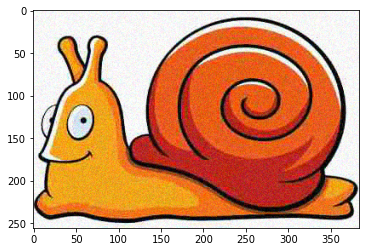

In [84]:
plt.imshow(image)

In [0]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

image_torch = image.permute(2,0,1)[None].to(device)

x_input = torch.Tensor(np.random.random(size = image_torch.shape)).to(device)

model = Network(x_input.shape[1]).to(device)
model = model.float()
mse = torch.nn.MSELoss().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.002)

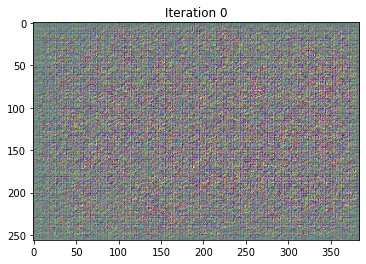

0 Loss: tensor(0.1941, device='cuda:0', grad_fn=<MeanBackward0>)
500 Loss: tensor(0.0104, device='cuda:0', grad_fn=<MeanBackward0>)
1000 Loss: tensor(0.0049, device='cuda:0', grad_fn=<MeanBackward0>)


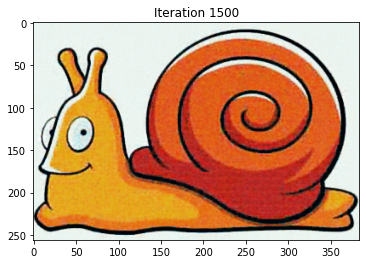

1500 Loss: tensor(0.0036, device='cuda:0', grad_fn=<MeanBackward0>)
2000 Loss: tensor(0.0032, device='cuda:0', grad_fn=<MeanBackward0>)
2500 Loss: tensor(0.0030, device='cuda:0', grad_fn=<MeanBackward0>)


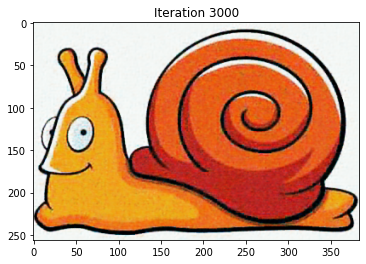

3000 Loss: tensor(0.0029, device='cuda:0', grad_fn=<MeanBackward0>)
3500 Loss: tensor(0.0028, device='cuda:0', grad_fn=<MeanBackward0>)
4000 Loss: tensor(0.0028, device='cuda:0', grad_fn=<MeanBackward0>)


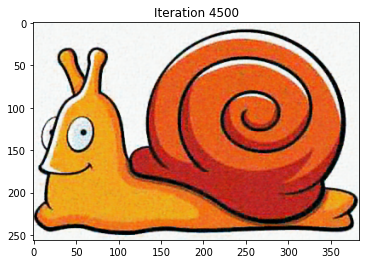

4500 Loss: tensor(0.0027, device='cuda:0', grad_fn=<MeanBackward0>)
5000 Loss: tensor(0.0027, device='cuda:0', grad_fn=<MeanBackward0>)
5500 Loss: tensor(0.0027, device='cuda:0', grad_fn=<MeanBackward0>)


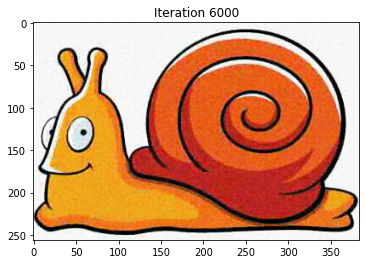

6000 Loss: tensor(0.0026, device='cuda:0', grad_fn=<MeanBackward0>)
6500 Loss: tensor(0.0026, device='cuda:0', grad_fn=<MeanBackward0>)
7000 Loss: tensor(0.0026, device='cuda:0', grad_fn=<MeanBackward0>)


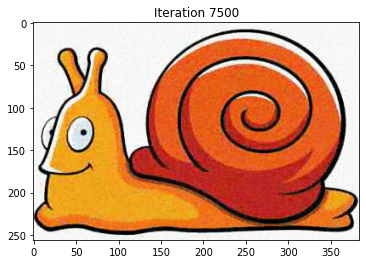

7500 Loss: tensor(0.0026, device='cuda:0', grad_fn=<MeanBackward0>)
8000 Loss: tensor(0.0026, device='cuda:0', grad_fn=<MeanBackward0>)
8500 Loss: tensor(0.0026, device='cuda:0', grad_fn=<MeanBackward0>)


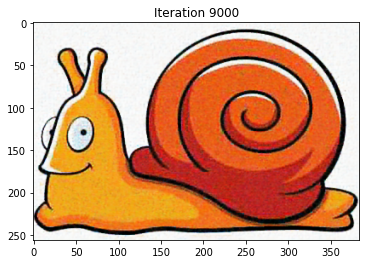

9000 Loss: tensor(0.0025, device='cuda:0', grad_fn=<MeanBackward0>)
9500 Loss: tensor(0.0026, device='cuda:0', grad_fn=<MeanBackward0>)
10000 Loss: tensor(0.0026, device='cuda:0', grad_fn=<MeanBackward0>)


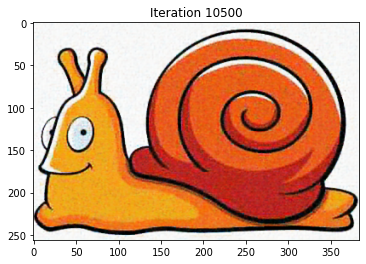

10500 Loss: tensor(0.0025, device='cuda:0', grad_fn=<MeanBackward0>)
11000 Loss: tensor(0.0026, device='cuda:0', grad_fn=<MeanBackward0>)
11500 Loss: tensor(0.0025, device='cuda:0', grad_fn=<MeanBackward0>)


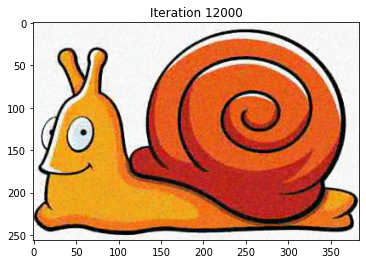

12000 Loss: tensor(0.0025, device='cuda:0', grad_fn=<MeanBackward0>)
12500 Loss: tensor(0.0025, device='cuda:0', grad_fn=<MeanBackward0>)
13000 Loss: tensor(0.0025, device='cuda:0', grad_fn=<MeanBackward0>)


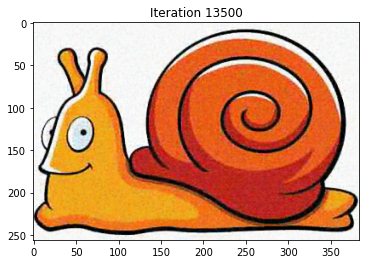

13500 Loss: tensor(0.0025, device='cuda:0', grad_fn=<MeanBackward0>)
14000 Loss: tensor(0.0025, device='cuda:0', grad_fn=<MeanBackward0>)
14500 Loss: tensor(0.0025, device='cuda:0', grad_fn=<MeanBackward0>)


In [86]:
num_iterations = 15000

for i in range(num_iterations):
    
    output = model(x_input)
    
    optimizer.zero_grad()
    loss = mse(image_torch, output)
    loss.backward()
    optimizer.step()
    if i%1500==0:
        plt.title('Iteration '+ str(i))
        plt.imshow(np.rollaxis(output.detach().cpu().numpy()[0], 0, 3))
        plt.pause(0.05)
    if i%500==0:
        print(i,'Loss:',loss)

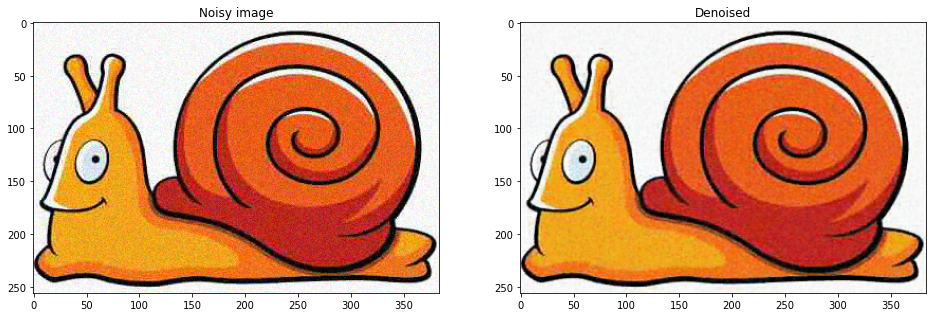

In [87]:
f, axarr = plt.subplots(1,2, figsize=(16,8))
axarr[0].imshow(image)
axarr[1].imshow(np.rollaxis(output.detach().cpu().numpy()[0], 0, 3))

axarr[0].title.set_text('Noisy image')
axarr[1].title.set_text('Denoised')

# Restoration

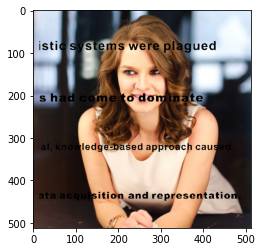

In [0]:
image = skimage.img_as_ubyte(io.imread('./data/inpainting/kate.png'))
to_tensor = transforms.ToTensor()

mask = skimage.img_as_ubyte(io.imread('./data/inpainting/kate_mask.png'))
image = to_tensor(image).permute(1,2,0)

mask = to_tensor(mask).squeeze(0)
mask = mask.repeat(1,3,1,1).squeeze(0).permute(1,2,0)

corrupt = image*mask
plt.imshow(corrupt)

In [0]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

image_torch = corrupt.permute(2,0,1)[None].to(device)
mask = mask.permute(2,0,1)[None].to(device)

x_input = torch.Tensor(np.random.random(size = image_torch.shape)).to(device)

In [0]:
#loss

model = Network(x_input.shape[1]).to(device)
model = model.float()
mse = torch.nn.MSELoss().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.02)


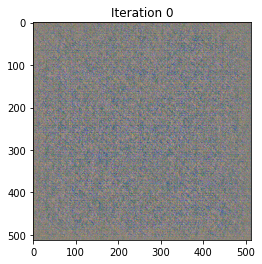

0 Loss: tensor(0.1526, device='cuda:0', grad_fn=<MeanBackward0>)
500 Loss: tensor(0.0008, device='cuda:0', grad_fn=<MeanBackward0>)


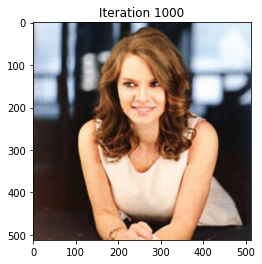

1000 Loss: tensor(0.0005, device='cuda:0', grad_fn=<MeanBackward0>)
1500 Loss: tensor(0.0003, device='cuda:0', grad_fn=<MeanBackward0>)


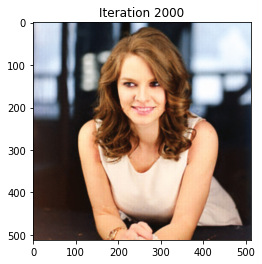

2000 Loss: tensor(0.0003, device='cuda:0', grad_fn=<MeanBackward0>)
2500 Loss: tensor(0.0003, device='cuda:0', grad_fn=<MeanBackward0>)


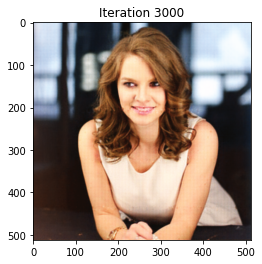

3000 Loss: tensor(0.0003, device='cuda:0', grad_fn=<MeanBackward0>)
3500 Loss: tensor(0.0002, device='cuda:0', grad_fn=<MeanBackward0>)


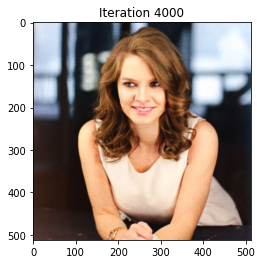

4000 Loss: tensor(0.0002, device='cuda:0', grad_fn=<MeanBackward0>)
4500 Loss: tensor(0.0002, device='cuda:0', grad_fn=<MeanBackward0>)


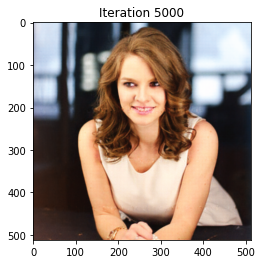

5000 Loss: tensor(0.0002, device='cuda:0', grad_fn=<MeanBackward0>)
5500 Loss: tensor(0.0002, device='cuda:0', grad_fn=<MeanBackward0>)


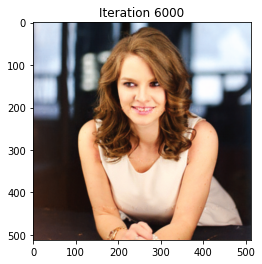

6000 Loss: tensor(0.0002, device='cuda:0', grad_fn=<MeanBackward0>)
6500 Loss: tensor(0.0002, device='cuda:0', grad_fn=<MeanBackward0>)


In [0]:
num_iterations = 7000

for i in range(num_iterations):
    
    output = model(x_input)
    
    optimizer.zero_grad()
    loss = mse(image_torch, output*mask)
    loss.backward()
    optimizer.step()
    if i%1000==0:
        plt.title('Iteration '+ str(i))
        plt.imshow(np.rollaxis(output.detach().cpu().numpy()[0], 0, 3))
        plt.pause(0.05)
    if i%500==0:
        print(i,'Loss:',loss)

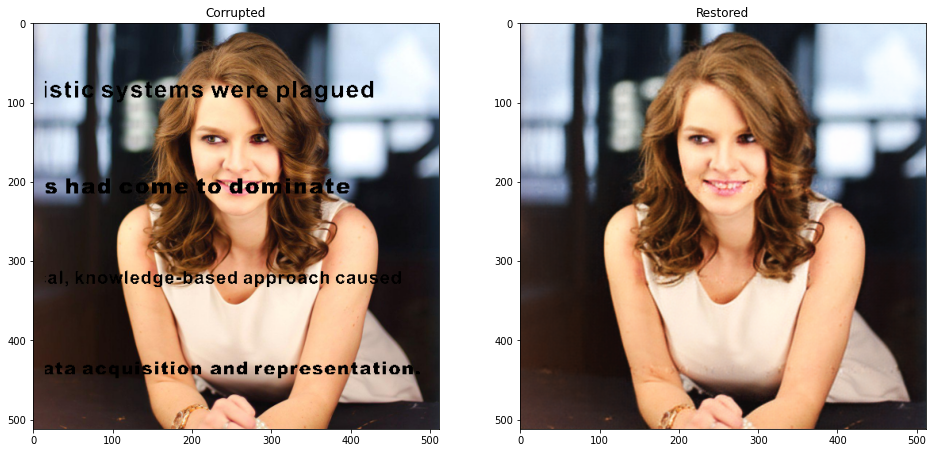

In [0]:
f, axarr = plt.subplots(1,2, figsize=(16,8))
axarr[0].imshow(corrupt)
axarr[1].imshow(np.rollaxis(output.detach().cpu().numpy()[0], 0, 3))

axarr[0].title.set_text('Corrupted')
axarr[1].title.set_text('Restored')


## Library

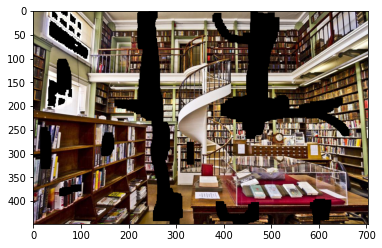

In [29]:
image = skimage.img_as_ubyte(io.imread('./data/inpainting/library.png'))
to_tensor = transforms.ToTensor()

mask = skimage.img_as_ubyte(io.imread('./data/inpainting/library_mask.png'))
image = to_tensor(image).permute(1,2,0)

mask = to_tensor(mask).squeeze(0)
mask = mask.repeat(1,3,1,1).squeeze(0).permute(1,2,0)

corrupt = image*mask
plt.imshow(corrupt)

In [0]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

image_torch = corrupt.permute(2,0,1)[None].to(device)
mask = mask.permute(2,0,1)[None].to(device)

x_input = torch.Tensor(np.random.random(size = image_torch.shape)).to(device)

model = Network(x_input.shape[1]).to(device)
model = model.float()
mse = torch.nn.MSELoss().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.02)

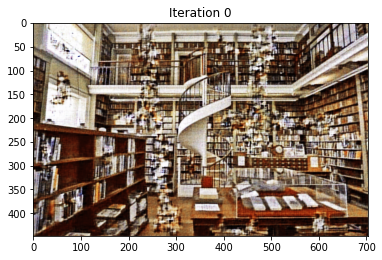

0 Loss: tensor(0.0044, device='cuda:0', grad_fn=<MeanBackward0>)
500 Loss: tensor(0.0033, device='cuda:0', grad_fn=<MeanBackward0>)


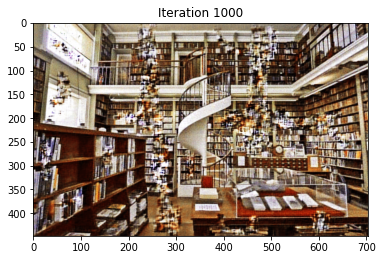

1000 Loss: tensor(0.0031, device='cuda:0', grad_fn=<MeanBackward0>)
1500 Loss: tensor(0.0029, device='cuda:0', grad_fn=<MeanBackward0>)


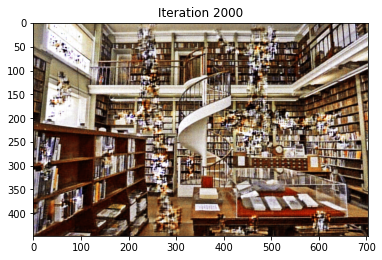

2000 Loss: tensor(0.0028, device='cuda:0', grad_fn=<MeanBackward0>)
2500 Loss: tensor(0.0027, device='cuda:0', grad_fn=<MeanBackward0>)


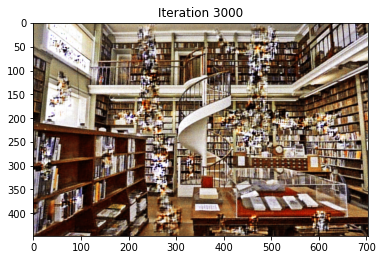

3000 Loss: tensor(0.0026, device='cuda:0', grad_fn=<MeanBackward0>)
3500 Loss: tensor(0.0025, device='cuda:0', grad_fn=<MeanBackward0>)


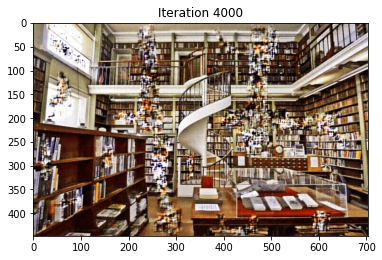

4000 Loss: tensor(0.0025, device='cuda:0', grad_fn=<MeanBackward0>)
4500 Loss: tensor(0.0027, device='cuda:0', grad_fn=<MeanBackward0>)


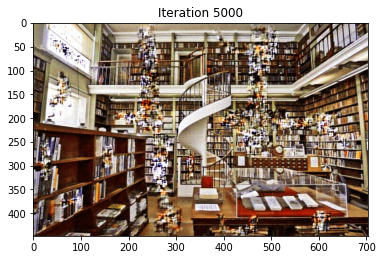

5000 Loss: tensor(0.0024, device='cuda:0', grad_fn=<MeanBackward0>)
5500 Loss: tensor(0.0024, device='cuda:0', grad_fn=<MeanBackward0>)


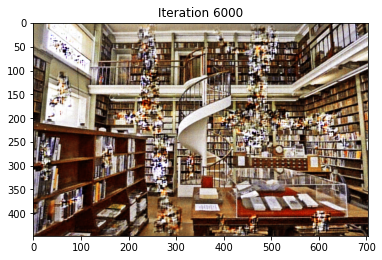

6000 Loss: tensor(0.0025, device='cuda:0', grad_fn=<MeanBackward0>)
6500 Loss: tensor(0.0024, device='cuda:0', grad_fn=<MeanBackward0>)


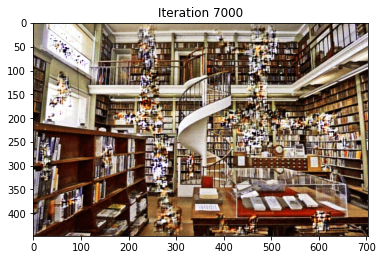

7000 Loss: tensor(0.0023, device='cuda:0', grad_fn=<MeanBackward0>)
7500 Loss: tensor(0.0025, device='cuda:0', grad_fn=<MeanBackward0>)


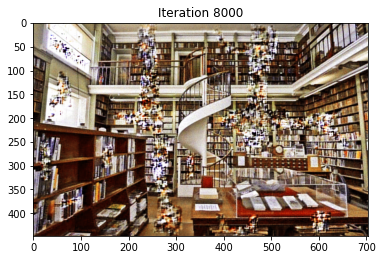

8000 Loss: tensor(0.0023, device='cuda:0', grad_fn=<MeanBackward0>)
8500 Loss: tensor(0.0023, device='cuda:0', grad_fn=<MeanBackward0>)


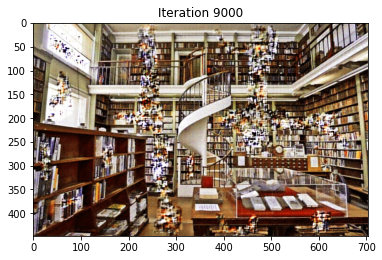

9000 Loss: tensor(0.0023, device='cuda:0', grad_fn=<MeanBackward0>)
9500 Loss: tensor(0.0022, device='cuda:0', grad_fn=<MeanBackward0>)


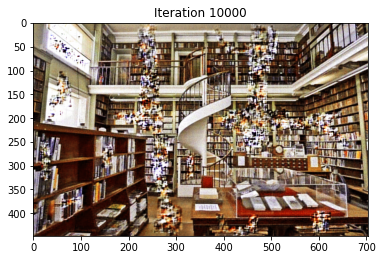

10000 Loss: tensor(0.0023, device='cuda:0', grad_fn=<MeanBackward0>)
10500 Loss: tensor(0.0023, device='cuda:0', grad_fn=<MeanBackward0>)


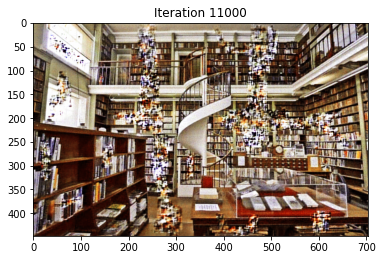

11000 Loss: tensor(0.0023, device='cuda:0', grad_fn=<MeanBackward0>)
11500 Loss: tensor(0.0022, device='cuda:0', grad_fn=<MeanBackward0>)


KeyboardInterrupt: ignored

In [34]:
num_iterations = 15000

for i in range(num_iterations):
    
    output = model(x_input)
    
    optimizer.zero_grad()
    loss = mse(image_torch, output*mask)
    loss.backward()
    optimizer.step()
    if i%1000==0:
        plt.title('Iteration '+ str(i))
        plt.imshow(np.rollaxis(output.detach().cpu().numpy()[0], 0, 3))
        plt.pause(0.05)
    if i%500==0:
        print(i,'Loss:',loss)

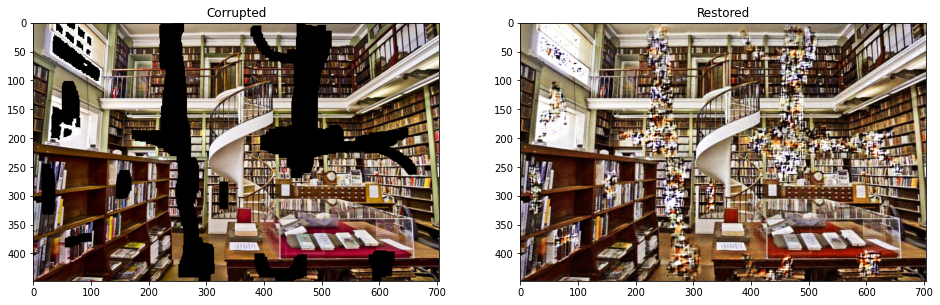

In [35]:
f, axarr = plt.subplots(1,2, figsize=(16,8))
axarr[0].imshow(corrupt)
axarr[1].imshow(np.rollaxis(output.detach().cpu().numpy()[0], 0, 3))

axarr[0].title.set_text('Corrupted')
axarr[1].title.set_text('Restored')

## Vase

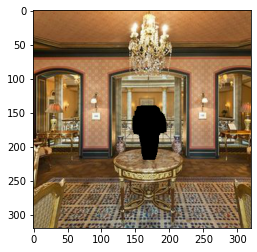

In [23]:
image = skimage.img_as_ubyte(io.imread('./data/inpainting/vase.png'))
to_tensor = transforms.ToTensor()

mask = skimage.img_as_ubyte(io.imread('./data/inpainting/vase_mask.png'))
image = to_tensor(image).permute(1,2,0)

mask = to_tensor(mask).squeeze(0)
mask = mask.repeat(1,3,1,1).squeeze(0).permute(1,2,0)

corrupt = image*mask
plt.imshow(corrupt)

In [0]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

image_torch = corrupt.permute(2,0,1)[None].to(device)
mask = mask.permute(2,0,1)[None].to(device)

x_input = torch.Tensor(np.random.random(size = image_torch.shape)).to(device)

model = Network(x_input.shape[1]).to(device)
model = model.float()
mse = torch.nn.MSELoss().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.03)

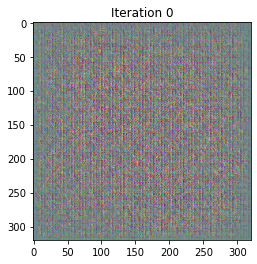

0 Loss: tensor(0.0902, device='cuda:0', grad_fn=<MeanBackward0>)
500 Loss: tensor(0.0034, device='cuda:0', grad_fn=<MeanBackward0>)


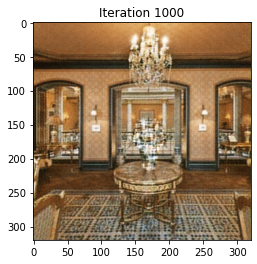

1000 Loss: tensor(0.0021, device='cuda:0', grad_fn=<MeanBackward0>)
1500 Loss: tensor(0.0019, device='cuda:0', grad_fn=<MeanBackward0>)


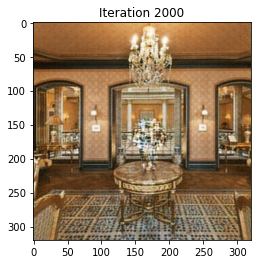

2000 Loss: tensor(0.0017, device='cuda:0', grad_fn=<MeanBackward0>)
2500 Loss: tensor(0.0015, device='cuda:0', grad_fn=<MeanBackward0>)


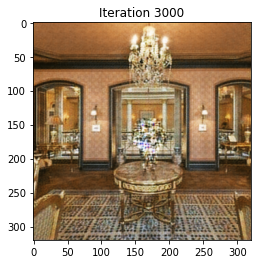

3000 Loss: tensor(0.0015, device='cuda:0', grad_fn=<MeanBackward0>)
3500 Loss: tensor(0.0014, device='cuda:0', grad_fn=<MeanBackward0>)


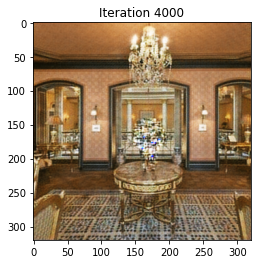

4000 Loss: tensor(0.0013, device='cuda:0', grad_fn=<MeanBackward0>)
4500 Loss: tensor(0.0014, device='cuda:0', grad_fn=<MeanBackward0>)


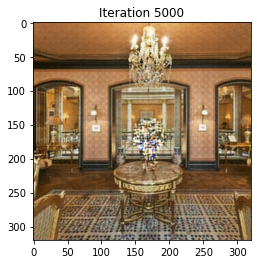

5000 Loss: tensor(0.0013, device='cuda:0', grad_fn=<MeanBackward0>)
5500 Loss: tensor(0.0013, device='cuda:0', grad_fn=<MeanBackward0>)


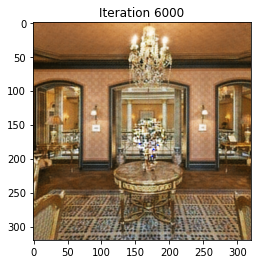

6000 Loss: tensor(0.0013, device='cuda:0', grad_fn=<MeanBackward0>)
6500 Loss: tensor(0.0013, device='cuda:0', grad_fn=<MeanBackward0>)


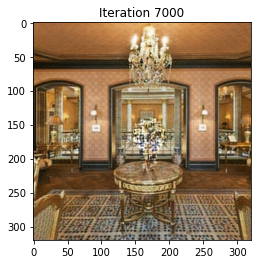

7000 Loss: tensor(0.0013, device='cuda:0', grad_fn=<MeanBackward0>)
7500 Loss: tensor(0.0012, device='cuda:0', grad_fn=<MeanBackward0>)


In [25]:
num_iterations = 15000

for i in range(num_iterations):
    
    output = model(x_input)
    
    optimizer.zero_grad()
    loss = mse(image_torch, output*mask)
    loss.backward()
    optimizer.step()
    if i%1000==0:
        plt.title('Iteration '+ str(i))
        plt.imshow(np.rollaxis(output.detach().cpu().numpy()[0], 0, 3))
        plt.pause(0.05)
    if i%500==0:
        print(i,'Loss:',loss)

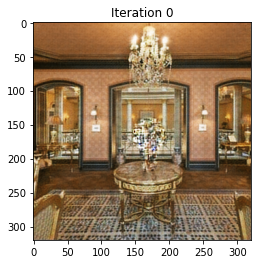

0 Loss: tensor(0.0013, device='cuda:0', grad_fn=<MeanBackward0>)
500 Loss: tensor(0.0012, device='cuda:0', grad_fn=<MeanBackward0>)


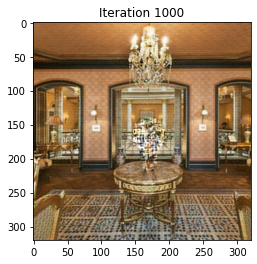

1000 Loss: tensor(0.0012, device='cuda:0', grad_fn=<MeanBackward0>)
1500 Loss: tensor(0.0012, device='cuda:0', grad_fn=<MeanBackward0>)


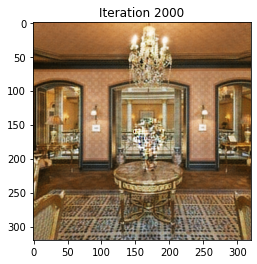

2000 Loss: tensor(0.0012, device='cuda:0', grad_fn=<MeanBackward0>)
2500 Loss: tensor(0.0011, device='cuda:0', grad_fn=<MeanBackward0>)


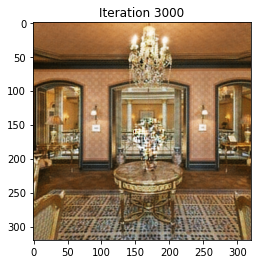

3000 Loss: tensor(0.0011, device='cuda:0', grad_fn=<MeanBackward0>)
3500 Loss: tensor(0.0011, device='cuda:0', grad_fn=<MeanBackward0>)


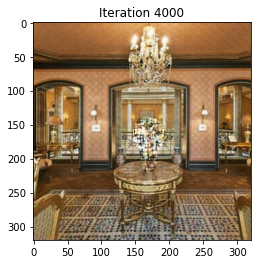

4000 Loss: tensor(0.0011, device='cuda:0', grad_fn=<MeanBackward0>)
4500 Loss: tensor(0.0011, device='cuda:0', grad_fn=<MeanBackward0>)


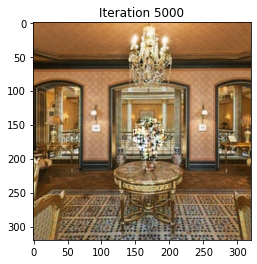

5000 Loss: tensor(0.0011, device='cuda:0', grad_fn=<MeanBackward0>)
5500 Loss: tensor(0.0011, device='cuda:0', grad_fn=<MeanBackward0>)


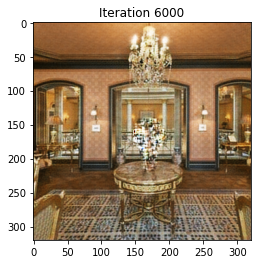

6000 Loss: tensor(0.0011, device='cuda:0', grad_fn=<MeanBackward0>)
6500 Loss: tensor(0.0011, device='cuda:0', grad_fn=<MeanBackward0>)


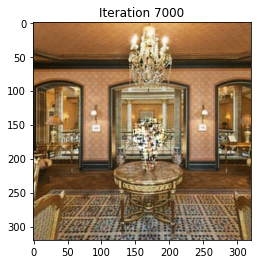

7000 Loss: tensor(0.0011, device='cuda:0', grad_fn=<MeanBackward0>)
7500 Loss: tensor(0.0011, device='cuda:0', grad_fn=<MeanBackward0>)


In [26]:
num_iterations = 8000

for i in range(num_iterations):
    
    output = model(x_input)
    
    optimizer.zero_grad()
    loss = mse(image_torch, output*mask)
    loss.backward()
    optimizer.step()
    if i%1000==0:
        plt.title('Iteration '+ str(i))
        plt.imshow(np.rollaxis(output.detach().cpu().numpy()[0], 0, 3))
        plt.pause(0.05)
    if i%500==0:
        print(i,'Loss:',loss)

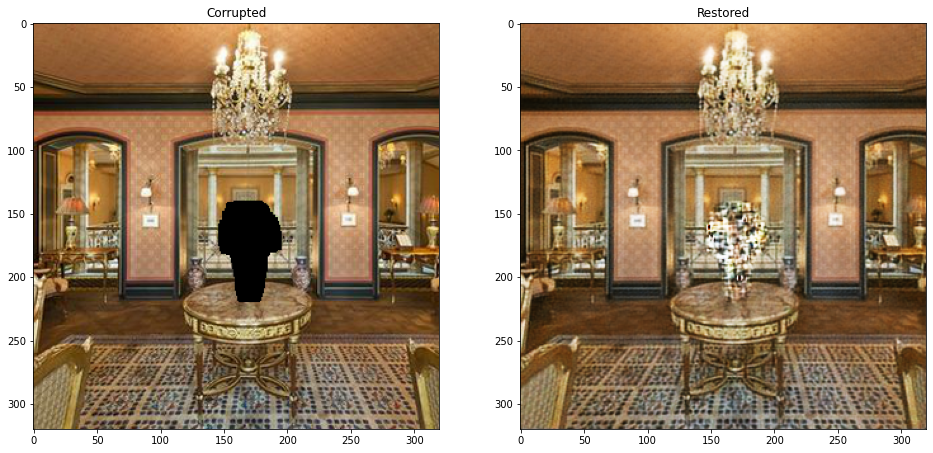

In [27]:
f, axarr = plt.subplots(1,2, figsize=(16,8))
axarr[0].imshow(corrupt)
axarr[1].imshow(np.rollaxis(output.detach().cpu().numpy()[0], 0, 3))

axarr[0].title.set_text('Corrupted')
axarr[1].title.set_text('Restored')